# Coursera Project

Course: IBM Machine Learning Series: C5 - Neural Networks

by: Bashar Albaalbaki

Sep 2025

## 1. Problem Statement: Austin TX weather forecast

In this project we will look at Austin, the capital of state of Texas and do the followings
1. Building an MLP autoencoder to compress the weather data!
2. Forecasting next hour weather by using the past 24 hour compessed weather data using recurrent Neural Networks!

In particular, we have selected Austin city because it one of the centers in US for development of clean geothermal heating and cooling systems.

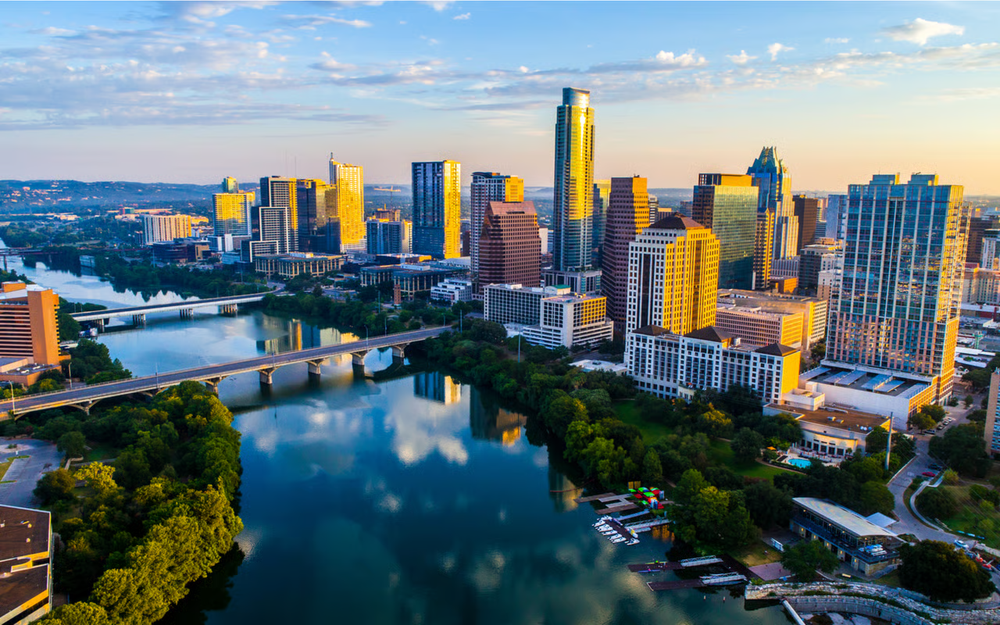

### Background:

Weather forecasting using neural networks is one of exciting aookication of machine learning, neural network and particularly recurrent neural networks (RNN), see for example tensofrflow own guideline on weather forecasting using RNN.

https://www.tensorflow.org/tutorials/structured_data/time_series

Also, see the following paper for a recent review of weather forecasting using neural networks and machine learning in general:

[Zhang, H., Liu, Y., Zhang, C. and Li, N., 2025. Machine learning methods for weather forecasting: A survey. Atmosphere, 16(1), p.82.](https://www.mdpi.com/2073-4433/16/1/82)

### Neural Networks Trained here:
1. Autoencoder Deep Neural Network: We will try to find the minimum number of latent features for an encoder-decoder network so that the weather data can be recovered with at least 95% coefficient of determination.
2. Simple Multi-Layer Perceptron (MLP) to forecast weather using the past 24 hour data
3. A deep Convolutuinal Neural Network (CNN) to forecast weather using the past 24 hour data
4. A Simple Recurrent Neural Network (RNN) that will be followed by deep MLP to forecast weather using the past 24 hour data
5. A Long Short-Term memory (LSTM) Netowrk that will be followed by deep MLP to forecast weather using the past 24 hour data
6. And finally a Gated Recurrent Unit (GRU) Network that will be followed by deep MLP to forecast weather using the past 24 hour data
7. Finally among the networks in 2-6 will find the most successfull one to predict the validation data and then test the selected model on test data.

### Challenges Anticipated
1. Even with most advanced forecasting models there is a limit on how much the weather can be predicted. One reason for such unpredictabilty are the effect of many events that a model cannot consider just by looking at previous data. These event could be natural such as a storm that does not follow weather patterns or it could be human activity for example due global warming the next year weather pattern might not follow exactly the previous ones.
2. Capacity of models trained here are limited to what can be trained on a personal computer!
3. Data limitation: Here we will try to try a weather forcaster bu just looking at past 24-hour data of the same location. In reality the weather prediction should include not one but data from many weather stations.

## 2. Imports

For neural networks, tensorflow is employed:

In [146]:
import tensorflow as tf
import keras
from keras import layers,Input, Sequential
from keras.layers import (
    Dense,
    Dropout,
    Normalization,
    SimpleRNN,
    LSTM,
    GRU,
    Conv2D,
    MaxPool2D,
    Flatten,
    LayerNormalization,
    BatchNormalization,
    Reshape,
)
from keras.models import Model
from tensorflow.keras.preprocessing.sequence import TimeseriesGenerator
from tensorflow.keras.callbacks import EarlyStopping
tf.random.set_seed(123) 
keras.utils.set_random_seed(123)

And, the usual libraries for handling data and plotting:

In [82]:
import time
import numpy as np
np.random.seed(123)
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from enum import Enum, auto

We will also will be using sklearn train/test split, scalers and R^2 metric: 

In [83]:
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler, MinMaxScaler
from sklearn.metrics import r2_score

## 3. Data Building

Not executed in this notebook but using open-metro, a free weather-API for non-commerical usage, the weather of Austin, TX has been gathered from Jan 1st 1992 to Dec 31st of 2024. To avoid disconnection issues with the API, the data were gathered annually, year by year. The downloaded data is in form of json format, which are changed and merged into a single csv file that is uploaded below:

In [84]:
df = pd.read_csv("data/Austin_weather.csv")
df.head()

,timestamp,temperature_2m,relative_humidity_2m,precipitation,rain,showers,snowfall,snow_depth,dew_point_2m,wind_speed_10m,wind_direction_10m,wind_gusts_10m,cloud_cover,surface_pressure
0,1992-01-01 00:00:00,-24.4,71,0.0,0.0,0.0,0.0,0.04,-28.1,7.4,231,31.3,19,586.2
1,1992-01-01 01:00:00,-24.1,67,0.0,0.0,0.0,0.0,0.04,-28.4,7.2,233,31.0,20,587.3
2,1992-01-01 02:00:00,-21.9,60,0.0,0.0,0.0,0.0,0.04,-27.6,6.9,231,29.9,22,590.1
3,1992-01-01 03:00:00,-18.4,52,0.0,0.0,0.0,0.0,0.04,-25.8,6.9,227,29.5,30,594.9
4,1992-01-01 04:00:00,-15.5,50,0.0,0.0,0.0,0.0,0.04,-23.6,6.4,223,29.9,32,597.3


In [85]:
df.tail()

,timestamp,temperature_2m,relative_humidity_2m,precipitation,rain,showers,snowfall,snow_depth,dew_point_2m,wind_speed_10m,wind_direction_10m,wind_gusts_10m,cloud_cover,surface_pressure
289291,2024-12-31 19:00:00,-10.5,39,0.0,0.0,0.0,0.0,0.0,-21.9,6.6,249,31.3,0,598.5
289292,2024-12-31 20:00:00,-10.7,43,0.0,0.0,0.0,0.0,0.0,-20.8,6.5,251,31.3,0,598.4
289293,2024-12-31 21:00:00,-11.0,45,0.0,0.0,0.0,0.0,0.0,-20.6,6.3,252,30.6,0,597.7
289294,2024-12-31 22:00:00,-11.2,45,0.0,0.0,0.0,0.0,0.0,-20.9,6.3,252,29.9,5,597.4
289295,2024-12-31 23:00:00,-11.4,45,0.0,0.0,0.0,0.0,0.0,-21.1,6.2,249,29.5,0,597.2


In [86]:
df.shape

(289296, 14)

Open-metro can provide much more features for each row of weather point; however, to make the project managable only 13 features are requested. 

Note that here the _2m after feature names denotes the height of the sensor from ground.

Now, let's look at pandas description of data:

In [87]:
df.drop(columns=["timestamp"], axis = 0).describe()

,temperature_2m,relative_humidity_2m,precipitation,rain,showers,snowfall,snow_depth,dew_point_2m,wind_speed_10m,wind_direction_10m,wind_gusts_10m,cloud_cover,surface_pressure
count,289296.000000,289296.000000,289296.000000,289296.000000,289296.0,289296.000000,289296.000000,289296.000000,289296.000000,289296.000000,289296.000000,289296.000000,289296.000000
mean,0.513258,60.758175,0.105224,0.085701,0.0,0.014495,0.021627,-7.226345,6.442229,213.498994,27.665582,49.799849,607.963696
std,8.935736,22.439488,0.346003,0.324204,0.0,0.075766,0.052919,10.022550,3.337264,63.901434,11.637471,38.903983,7.836937
min,-36.500000,2.000000,0.000000,0.000000,0.0,0.000000,0.000000,-42.700000,0.000000,1.000000,3.600000,0.000000,575.000000
25%,-6.200000,43.000000,0.000000,0.000000,0.0,0.000000,0.000000,-15.300000,4.100000,191.000000,19.800000,7.000000,602.100000
50%,1.300000,62.000000,0.000000,0.000000,0.0,0.000000,0.000000,-7.300000,6.100000,219.000000,25.600000,49.000000,609.400000
75%,7.600000,80.000000,0.000000,0.000000,0.0,0.000000,0.020000,2.300000,8.000000,243.000000,33.100000,93.000000,614.400000
max,21.000000,100.000000,10.200000,10.200000,0.0,3.150000,0.570000,16.300000,26.700000,360.000000,112.000000,100.000000,625.500000


We can see that the feature "showers" has both min and max equal to zero, so we will remove it:

In [88]:
df_cleaned = df.drop(columns=["showers"], axis = 0)
df_cleaned.shape

(289296, 13)

Next checking that there is no non-numbers hidden in the dataframe:

In [89]:
df_cleaned = df_cleaned.dropna()
df_cleaned.shape

(289296, 13)

We will add two extra features: day of the year and hour of the day. The weather prediction depends on the annual and daily cycles, and most likely we will not be able to train any weather forecaster without considering them. Note that if we had only one or two years of weather data there was a danger from the models to rely solely on these two features and use them as key. However, we have 33 years of data so hopefully the overfitting dangers will be limited.

In [90]:
timestamps = pd.to_datetime(df_cleaned["timestamp"])
df_cleaned["day_of_year"] = timestamps.dt.dayofyear
df_cleaned["day_of_year"].value_counts()

day_of_year
1      792
252    792
250    792
249    792
248    792
      ... 
121    792
120    792
119    792
118    792
366    216
Name: count, Length: 366, dtype: int64

In [91]:
df_cleaned["hour"] = timestamps.dt.hour
df_cleaned["hour"].value_counts()

hour
0     12054
1     12054
22    12054
21    12054
20    12054
19    12054
18    12054
17    12054
16    12054
15    12054
14    12054
13    12054
12    12054
11    12054
10    12054
9     12054
8     12054
7     12054
6     12054
5     12054
4     12054
3     12054
2     12054
23    12054
Name: count, dtype: int64

Finally we will extract the data as X by copying all the columns except timestamps to X:

In [92]:
X = df_cleaned.drop(columns=["timestamp"], axis=0)
X.shape

(289296, 14)

Now, let's try to look at correlation heatmap for X:

<Axes: >

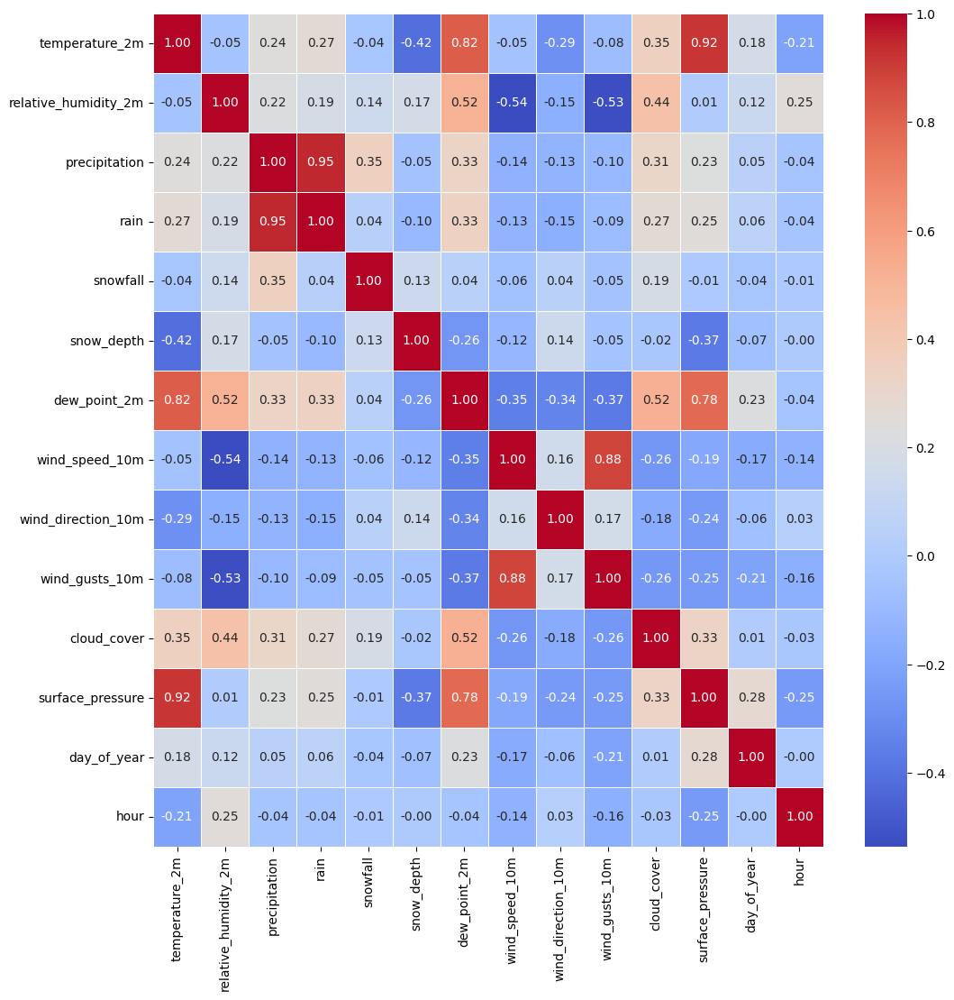

In [13]:
correlation_matrix = X.corr()
plt.figure(figsize=(12, 12))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt=".2f", linewidths=.5)

From the above correlation heatmap we see two strong existing correlations:
1. Surface pressure and temperature_2m (temperature 2m above surface): correlatoion = 0.92
2. Rain and precipitation: correlation = 0.95

Setting a strong correlation that will warant removal of a feature at 95%:
1. Both surface pressure and temperature_2m are kept because the cor < 0.95
2. Rain is removed in facor of precipitation. Bit before that let's look at their coorelation more closely:  

In [93]:
np.corrcoef(X["precipitation"].values, X["rain"].values)[0][1]

0.9502356824582321

Thus Corr(rain, precipitation) > 0.95. 

Removing rain:

In [94]:
X = X.drop(columns=["rain"], axis = 0)

In [95]:
X.sample(10)

,temperature_2m,relative_humidity_2m,precipitation,snowfall,snow_depth,dew_point_2m,wind_speed_10m,wind_direction_10m,wind_gusts_10m,cloud_cover,surface_pressure,day_of_year,hour
76519,11.9,61,0.3,0.00,0.00,4.6,7.2,174,29.9,60,616.3,267,7
11489,-5.3,46,0.0,0.00,0.01,-15.1,1.1,270,10.1,64,602.9,113,17
249561,18.7,34,0.0,0.00,0.00,2.7,11.5,256,50.8,85,618.1,172,9
168526,-7.2,93,0.4,0.28,0.28,-8.2,1.6,297,22.0,99,601.3,82,22
211216,-6.1,31,0.0,0.00,0.00,-20.5,1.1,180,21.2,3,602.7,35,16
280266,-12.8,45,0.0,0.00,0.02,-22.2,13.9,239,42.8,4,596.8,355,18
73909,12.0,55,0.0,0.00,0.00,3.3,5.4,180,23.8,51,613.5,158,13
235519,1.8,31,0.0,0.00,0.02,-13.8,13.7,243,53.6,1,606.5,317,7
129296,10.9,68,1.1,0.00,0.00,5.3,4.5,119,20.5,72,618.6,274,8
184332,-8.9,44,0.0,0.00,0.02,-18.9,4.3,360,23.8,91,596.2,10,12


In [96]:
X.shape

(289296, 13)

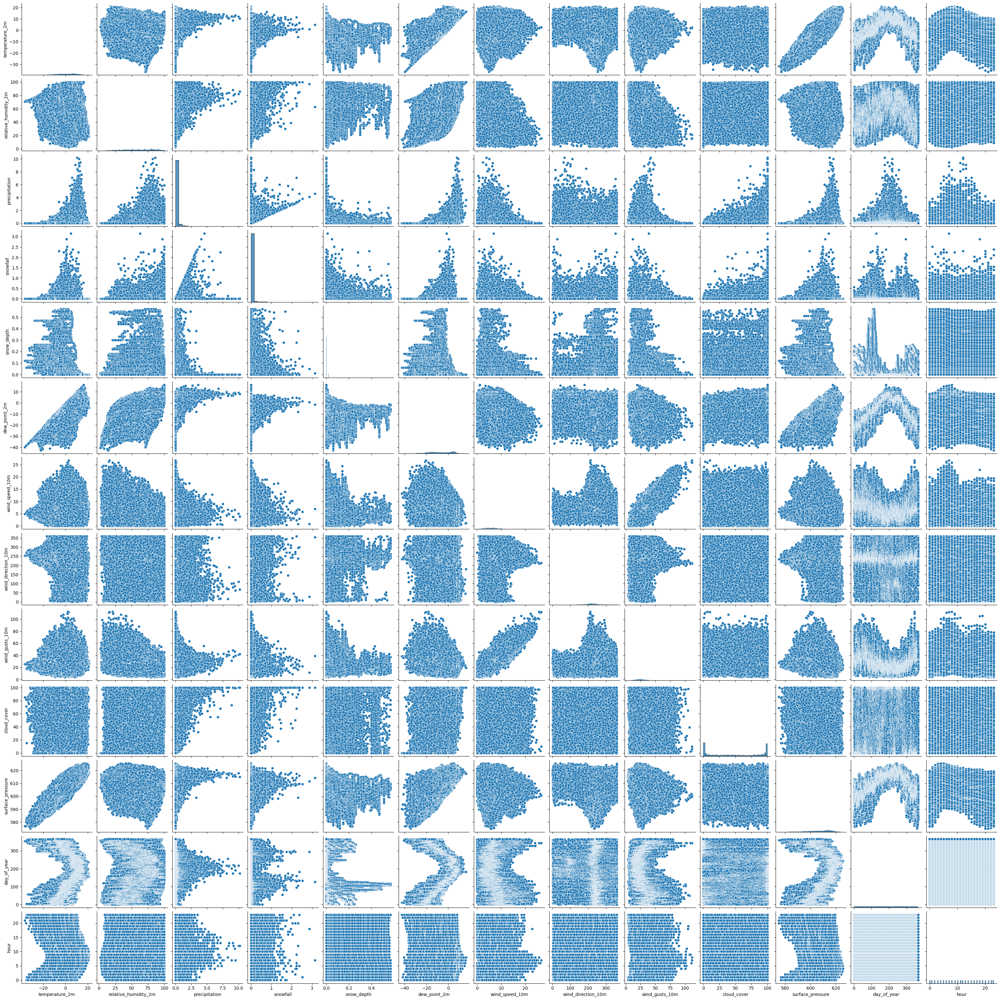

In [18]:
sns.pairplot(X)

Looking at pairplots other features that seem correlated are:
1. Wind speed and wind guts, corr = 0.88
2. Temperature and surface pressure, as mentioned before, corr = 0.92
Also as mentioned above althgough both pairs are correlated on visual inspection, but we stick to requiring corr > 0.95 for feature removal.

Nevertheless, when we train autoencoders in the next section, the features will be compressed as much as possible to get 95% recovery of original features.

Finally, let's also look at some of the features in isolation to understand their tiemseries behaviour. 

But first here is helper function for plotting features:

In [97]:
def plot_feature_1y(year:int, feature_name):
    year_start = f"{year}-01-01"
    year_end = f"{year + 1}-01-01"
    timestamps_year = timestamps[
        (timestamps >= pd.Timestamp(year_start)) & (timestamps < pd.Timestamp(year_end))
    ]
    df_year = df_cleaned[
        (timestamps >= pd.Timestamp(year_start)) & (timestamps < pd.Timestamp(year_end))
    ]
    print(f"           {year}                     ")
    _ , ax = plt.subplots(12 , 1, figsize=(10,20))
    for i in range(12):
        timestamps_month = timestamps_year[timestamps_year.dt.month == (i + 1)]
        df_month = df_year[timestamps_year.dt.month == (i + 1)]
        ax[i].plot(timestamps_month , df_month[feature_name].values)
        if i == 0 or i == 11:
            ax[i].set_ylabel(feature_name)

Plotting features temperature_2m and snow_depth:

           2013                     


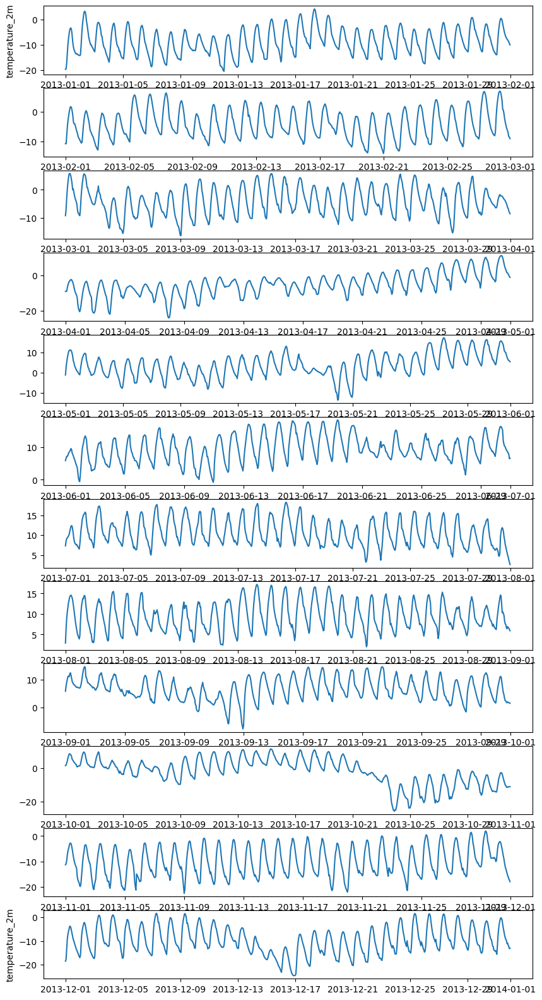

In [98]:
plot_feature_1y(year=2013, feature_name="temperature_2m")

           2013                     


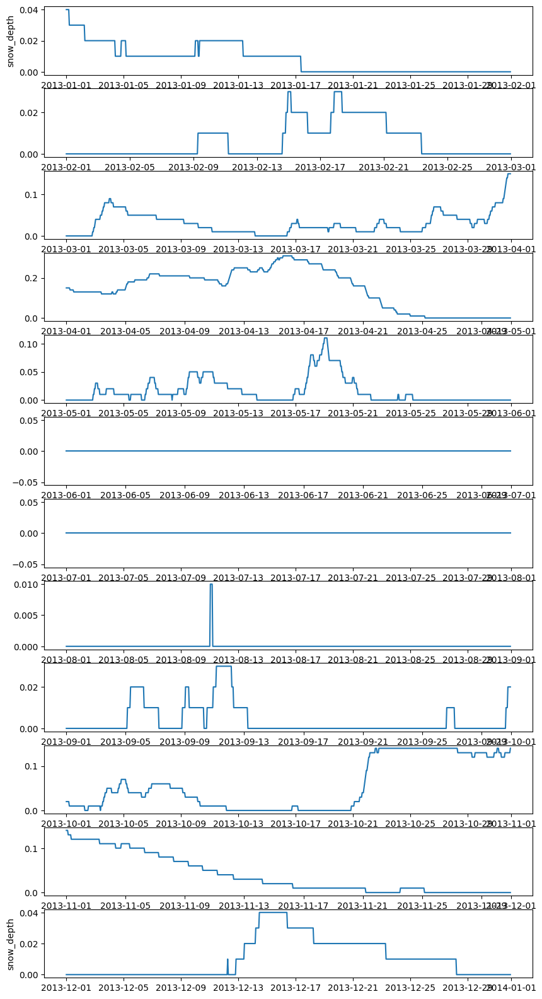

In [104]:
plot_feature_1y(year=2013, feature_name="snow_depth")

Thus, we observe that the snow depth behaves totally different from temperature!!!

#### So: how can we build a forecaster if features behaves so differently?

I belive part of answer is in building a encoder and decoder network to minimize features and then divide and conquer with less number of features.

## 4. Building a Deep AutoEncoder Neural Network to Compress Weather Data

In this section we will train endcode-decoder networks and iteratively find the number of latent features that could best represent the data. First we split the data into three groups: training set, validation set and testing set. For each split the shuffling is set to True. Note that we will not used shuffled data later in this notebook for training recurrent neural networks and rather use the time-series data.

In [99]:
X = X.values
X_train, XX = train_test_split(X, random_state=42, shuffle=True, test_size=0.2)
X_val, X_test = train_test_split(XX, random_state=24, shuffle=True, test_size=0.5)

In [100]:
print(f"X_train.shape = {X_train.shape}")
print(f"X_val.shape = {X_val.shape}")
print(f"X_test.shape = {X_test.shape}")

X_train.shape = (231436, 13)
X_val.shape = (28930, 13)
X_test.shape = (28930, 13)


Next we define the class for auto-encoder. The structure that worked at the end was found by some iteratiions and back-forth running the next cell and its consequent ones, but using the testing data. At the end it seemed having two deep layers of 200 neurons was enough non-linearity and the best model, as we will see below, worked well on the testing set.

In [101]:
class Autoencoder (Model):
    def __init__(self, input_dim, latent_dim):
        super().__init__()
        self.input_dim = input_dim
        self.latent_dim= latent_dim
        self.encoder = Sequential([
            Dense(input_dim, activation='relu'),
            Dense(200, activation='relu'),
            Dropout(0.2),
            Dense(200, activation='relu'),
            Dropout(0.2),
            Dense(latent_dim, activation='relu')
        ])
        self.decoder = tf.keras.Sequential([
            Dense(latent_dim, activation='relu'),
            Dense(200, activation='relu'),
            Dropout(0.2),
            Dense(200, activation='relu'),
            Dropout(0.2),
            Dense(input_dim, activation='linear'),
        ])

    def call(self, x):
        encoded = self.encoder(x)
        decoded = self.decoder(encoded)
        return decoded

Since neural networks prefer scaled data, the standard sclaer is used and training with the training data: 

In [102]:
ss = StandardScaler()
X_train_scaled = ss.fit_transform(X_train)
X_val_scaled = ss.transform(X_val)

Note that there is no need to worry about higher degree features like effect of temperature squared or interaction among features as the autoencoder neural networks are nonlinear and inherently will dicover those features.

A helper function to train autoencoders:

In [103]:
def train_autoencoder(X_train_scaled, latent_dim):
    input_dim = X_train_scaled.shape[1]
    autoencoder=Autoencoder(input_dim = input_dim, latent_dim=latent_dim)
    autoencoder.compile(optimizer='adam', loss='mse')
    autoencoder.fit(
        X_train_scaled, 
        X_train_scaled, 
        epochs=10, 
        batch_size=batch_size, 
        verbose=0)
    return autoencoder

Here, we iterate from latent dimension being one to one minus the full dimension of the input. For each autoencoder we will encode-decode the validation data and measure the coefficient of determination, $R_{val}^2$ , between the original validation data and the its recovered data.

In [105]:
latent_dims = np.arange(1 ,  X_train.shape[1])
autoencoders = []
r2_scores = []
batch_size = 32
for latent_dim in latent_dims:
  autoencoder=train_autoencoder(X_train_scaled=X_train_scaled, latent_dim=latent_dim)
  autoencoders.append(autoencoder)
  X_val_scaled_recovered = autoencoder.call(X_val_scaled).numpy()
  X_val_recovered = ss.inverse_transform(X_val_scaled_recovered)
  r2 = r2_score(y_true=X_val, y_pred=X_val_recovered)
  r2_scores.append(r2)
  print(f" ========  Latent Dim = {latent_dim}, R^2 = {r2}")

 ========  Latent Dim = 1, R^2 = 0.6586944741460403
 ========  Latent Dim = 2, R^2 = 0.599622434741255
 ========  Latent Dim = 3, R^2 = 0.9063085370146269
 ========  Latent Dim = 4, R^2 = 0.9517247632398499
 ========  Latent Dim = 5, R^2 = 0.9493337915008231
 ========  Latent Dim = 6, R^2 = 0.9696922661428804
 ========  Latent Dim = 7, R^2 = 0.9909951729536064
 ========  Latent Dim = 8, R^2 = 0.9821584136259235
 ========  Latent Dim = 9, R^2 = 0.9900502122148775
 ========  Latent Dim = 10, R^2 = 0.9950658732533733
 ========  Latent Dim = 11, R^2 = 0.9972558678079546
 ========  Latent Dim = 12, R^2 = 0.9974463360300614


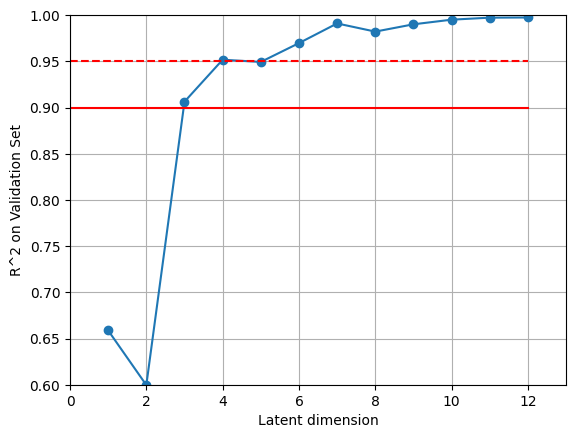

,Latent Dimension,R^2 on validation set
0,1,0.658694
1,2,0.599622
2,3,0.906309
3,4,0.951725
4,5,0.949334
5,6,0.969692
6,7,0.990995
7,8,0.982158
8,9,0.990050
9,10,0.995066


In [106]:
plt.plot(latent_dims, r2_scores, '-o')
plt.plot([0,12],[0.9,0.9],'r-')
plt.plot([0,12],[0.95,0.95],'r--')
plt.xlim(0, X_train.shape[1])
plt.ylim(0.6, 1)
# plt.scatter(latent_dims, r2_scores)
plt.xlabel("Latent dimension")
plt.ylabel("R^2 on Validation Set")
plt.grid(True)
plt.show()
df_r2 = pd.DataFrame()
df_r2["Latent Dimension"] = latent_dims
df_r2["R^2 on validation set"] = r2_scores
df_r2

From the above plot we see that with five latent features $R_{val}^2 > 0.95$ and so five features are enough to explain data variation by 95%. So, we select the latent_dim = 4.

In [107]:
best_autoencoder = autoencoders[3] # 4 features

Finally, we test the performance of the optimum encoder which is the endcoder with five latent dimensions on recovering the unseen test data: 

In [108]:
X_test_scaled = ss.transform(X_test)
X_test_scaled_recovered = best_autoencoder.call(X_test_scaled).numpy()
X_test_recovered = ss.inverse_transform(X_test_scaled_recovered)
r2_score(X_test, X_test_recovered)

0.9518539649131258

So we can see that the test data are recovered with also an $R_{test}^2 > 0.95$. So we use this autoencoder in the rest of this notebook. 

Next, let's go back to the unshuffled and temporally ordered data, scale them using the same scaler that is needed before applying the autoencoders, and finally apply the encoder part of autoencoder on them:

In [109]:
X_scaled = ss.transform(X)
X_encoded = best_autoencoder.encoder(X_scaled).numpy()
X_encoded.shape

(289296, 4)

Now, we look at the 4 compressed features and select 2013 as an example year. Before that let's add the X_encoded to df_cleaned:

In [110]:
for i in range(X_encoded.shape[1]):
    compressed_feature_name = f"comp_feature_{i + 1}"
    df_cleaned[compressed_feature_name] = X_encoded[:,i]

           2013                     


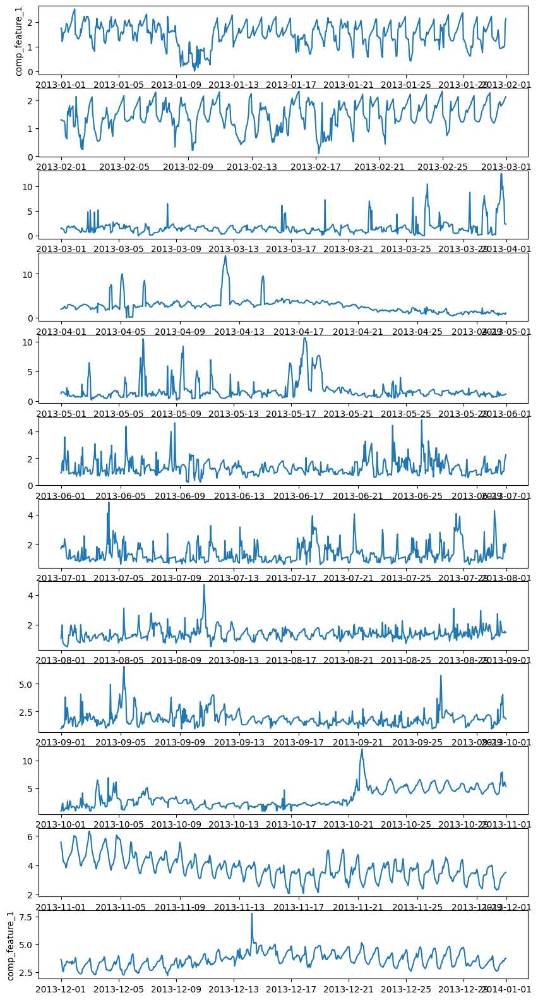

In [111]:
plot_feature_1y(year=2013, feature_name="comp_feature_1")

           2013                     


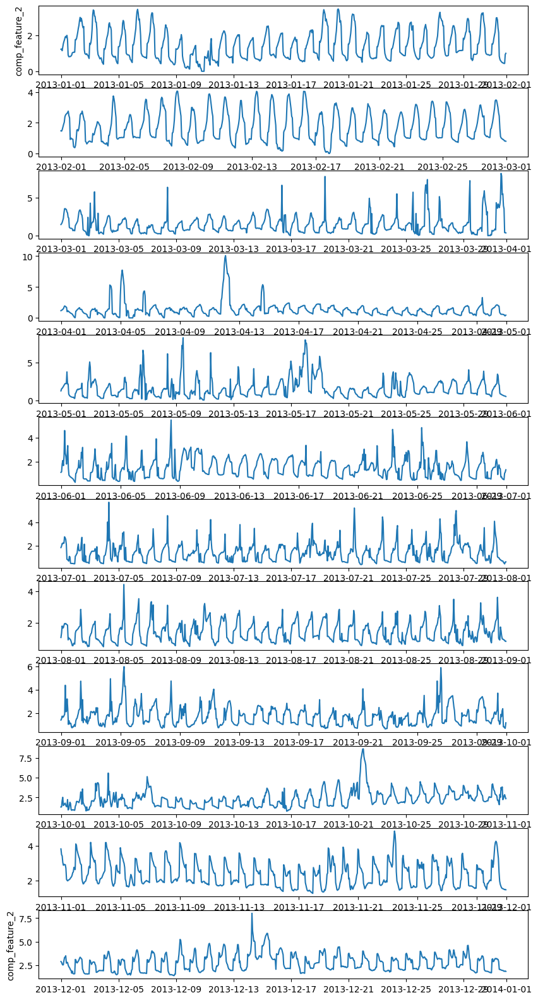

In [112]:
plot_feature_1y(year=2013, feature_name="comp_feature_2")

           2013                     


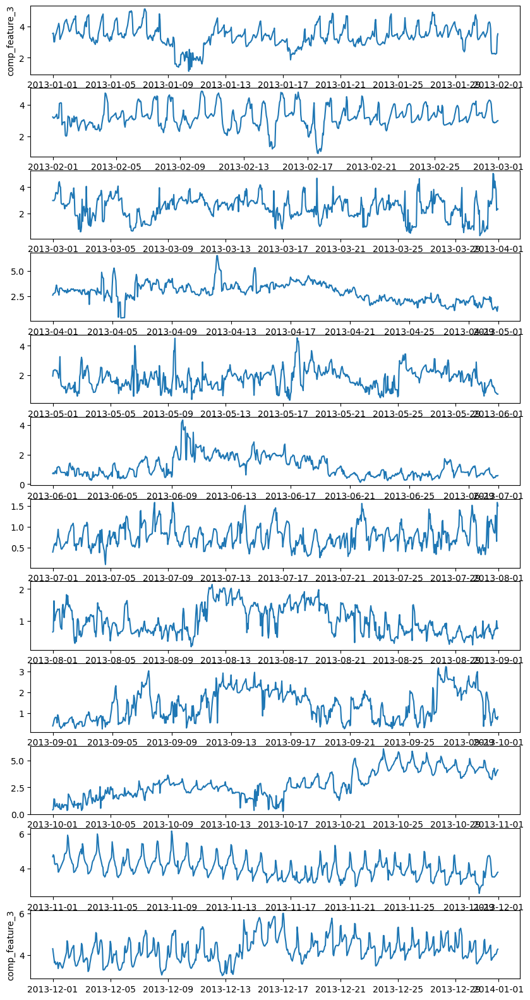

In [113]:
plot_feature_1y(year=2013, feature_name="comp_feature_3")

           2013                     


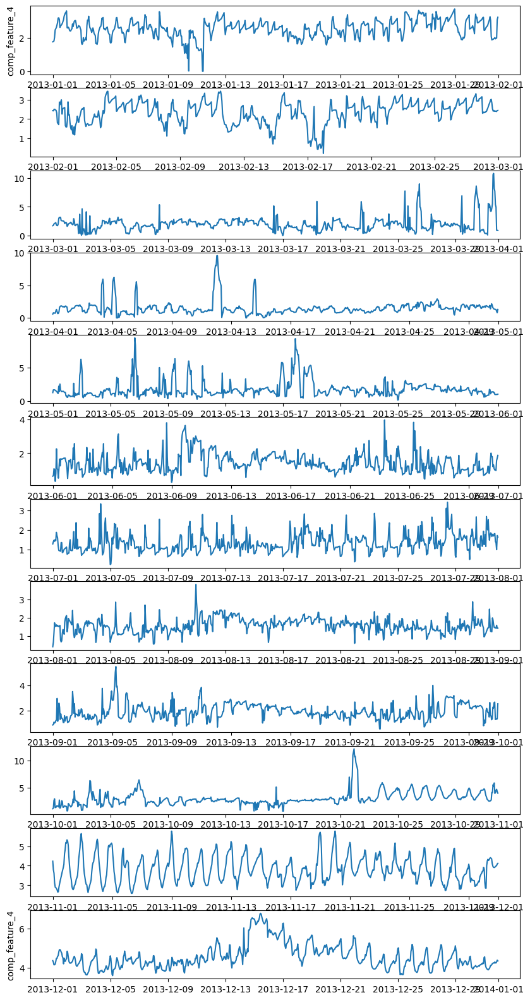

In [114]:
plot_feature_1y(year=2013, feature_name="comp_feature_4")

We can observe visually that almost now all four compressed features have daily cycles.

## 5. Neural Networks for Forecasting Weather

In this section we will build and examine five different neural networks from tensorflow including: MLP, CNN, RNN, LSTM and GRU. But, first we process the data little further. 

### 5.1 Re-splitting: Train-Validation-Test sets

How should we split the data among training, validation and testing sets?  Here instead of relying on a split ratio we try to reserve the last year of data, weather data for 2024, for testing and the data for 2023 as validation. So the training data would be the data from beginning of 1992 to the end of 2022:

In [115]:
train_end_timestamp = pd.Timestamp('2023-01-01')
train_end = df_cleaned[timestamps == train_end_timestamp].index[0]
print(f"train_end index = {train_end} , timestamp = {df_cleaned.loc[train_end, 'timestamp']}")

val_end_timestamp = pd.Timestamp('2024-01-01')
val_end = df_cleaned[timestamps == val_end_timestamp].index[0]
print(f"val_end index = {val_end} , timestamp = {df_cleaned.loc[val_end, 'timestamp']}")

test_end = len(df_cleaned) - 1
print(f"test_end index = {test_end} , timestamp = {df_cleaned.loc[test_end, 'timestamp']}")

train_end index = 271752 , timestamp = 2023-01-01 00:00:00
val_end index = 280512 , timestamp = 2024-01-01 00:00:00
test_end index = 289295 , timestamp = 2024-12-31 23:00:00


### 5.2 Rescaling the enocded data

Next, we will scale the compressed features as they will be fed into to a neural networks that generally work better if inputs are between -1 and 1. We call this scaling rescaling:

In [116]:
X_encoded_train = X_encoded[0:train_end,:]
mms = MinMaxScaler()
X_encoded_train_scaled = mms.fit_transform(X_encoded_train)

### 5.3 Forecasting Framework

How should the forecating work? Simply, we will train the RNN models to forcast next hour weather using the past three days weather data. Note that here we actually train and forecast on the compressed and rescaled 5 numbers that represent the full weather by 95% explainability.  

In [117]:
length = 24
n_features = X_encoded_train_scaled.shape[1]
print(f"n_features = {n_features}")

n_features = 4


In [118]:
X_encoded_val = X_encoded[train_end - length:val_end,:]
X_encoded_val_scaled = mms.transform(X_encoded_val)

Finally, a helper function for scoring the models based on the validation set:

In [153]:
def train_forecaster(length:int, batch_size:int, epochs:int, loss_type:str, Forecaster):
    t0 = time.time()
    generator_train = TimeseriesGenerator(
        X_encoded_train_scaled, 
        X_encoded_train_scaled, 
        length=length, 
        batch_size=batch_size,
    )
    generator_val = TimeseriesGenerator(
        X_encoded_val_scaled, 
        X_encoded_val_scaled, 
        length=length, 
        batch_size=batch_size,
    )
    forecaster = Forecaster(length=length, n_features=n_features)
    optimizer = tf.keras.optimizers.Adam(learning_rate=learning_rate)
    forecaster.compile(optimizer=optimizer, loss=loss_type)
    early_stopping = EarlyStopping(
        monitor='val_loss',  
        patience=5,          
        min_delta=0.0001,     
        mode='min',          
        restore_best_weights=True 
    )
    history = forecaster.fit(
        generator_train, 
        epochs=epochs, 
        validation_data=generator_val, 
        callbacks=[early_stopping],
    )
    print(f"Training Time = {(time.time() - t0) / 60} min")
    losses_train = history.history['loss']
    losses_val = history.history['val_loss']
    plt.plot(losses_train, label = "Training Losses")
    plt.plot(losses_val, label = "Validation Losses")
    plt.yscale("log")
    plt.xlabel("Epochs")
    plt.ylabel("Loss")
    plt.title(f"{forecaster.nn_type} Training Loss")
    plt.legend()
    plt.show()
    return forecaster

In the above function, the following features are used:
1. Optimizer is Adam
2. Both training and validation are prepared as a time series by using TensorFlow's TimeseriesGenerator
3. Early stopping also from TensorFlow is used.

Next, another helper function to measure coefficient of determination for validation data.

In [154]:
def validation_forecast(weather_forecaster, update_sequence_with_forcast:bool = False):
    t0 = time.time()
    forecasts_val = []
    forecast_error_percents = []
    model_input = X_encoded_val_scaled.copy()
    for i in range(model_input.shape[0] - length):
        sequence = model_input[i:i+length,:].reshape(1 , length, -1)
        forecast_scaled = weather_forecaster.call(sequence).numpy()
        forecast = mms.inverse_transform(forecast_scaled)
        forecasts_val.append(forecast)
        if update_sequence_with_forcast:
            model_input[i+length, 0:n_features] = forecast_scaled
    forecasts_val = np.array(forecasts_val).reshape(-1 , n_features)
    r2_val = r2_score(y_true=X_encoded_val[length:,:], y_pred=forecasts_val)
    print(f"{weather_forecaster.nn_type} R^2 = {r2_val}")
    print(f"Validation Time = {round((time.time() - t0) / 60.0 , 1)} min")

One note here is that, after training the models and using them for forecasting on the validation or test data, we will NOT use the forecasted data for further prediction. The main reason for such deicision is that for weather we expect that there is a continous stream of real data coming and if we only intent to predict the hour data we can rely on fresh data from sensors for the next hour to predict two hours from now and there is no need to use forecasts of next hours for forecast of two hours from now. 

### 5.4 Training a Deep Multi-Layer Perceptrons (MLP) Forecaster

In [149]:
class WeatherMLP (Model):
    def __init__(self, length:int, n_features:int):
        super().__init__()
        self.length = length
        self.n_features = n_features
        self.nn_type = "MLP"
        self.nn = Sequential([
            Flatten(input_shape=(length, n_features)),
            Dense(200, activation='relu'),
            Dropout(0.2),
            LayerNormalization(),
            Dense(200, activation='relu'),
            Dropout(0.2),
            Dense(n_features, activation='linear'),
        ])
    def call(self, x):
        forecast = self.nn(x)
        return forecast

Epoch 1/100
8492/8492 ━━━━━━━━━━━━━━━━━━━━ 18s 2ms/step - loss: 0.0017 - val_loss: 0.0015
Epoch 2/100
8492/8492 ━━━━━━━━━━━━━━━━━━━━ 17s 2ms/step - loss: 6.2534e-04 - val_loss: 0.0014
Epoch 3/100
8492/8492 ━━━━━━━━━━━━━━━━━━━━ 17s 2ms/step - loss: 5.5303e-04 - val_loss: 0.0012
Epoch 4/100
8492/8492 ━━━━━━━━━━━━━━━━━━━━ 17s 2ms/step - loss: 5.1982e-04 - val_loss: 0.0014
Epoch 5/100
8492/8492 ━━━━━━━━━━━━━━━━━━━━ 17s 2ms/step - loss: 5.0805e-04 - val_loss: 0.0012
Epoch 6/100
8492/8492 ━━━━━━━━━━━━━━━━━━━━ 17s 2ms/step - loss: 4.9650e-04 - val_loss: 0.0012
Epoch 7/100
8492/8492 ━━━━━━━━━━━━━━━━━━━━ 17s 2ms/step - loss: 4.9051e-04 - val_loss: 0.0015
Epoch 8/100
8492/8492 ━━━━━━━━━━━━━━━━━━━━ 17s 2ms/step - loss: 4.9272e-04 - val_loss: 0.0012
Training Time = 2.2982519547144573 min


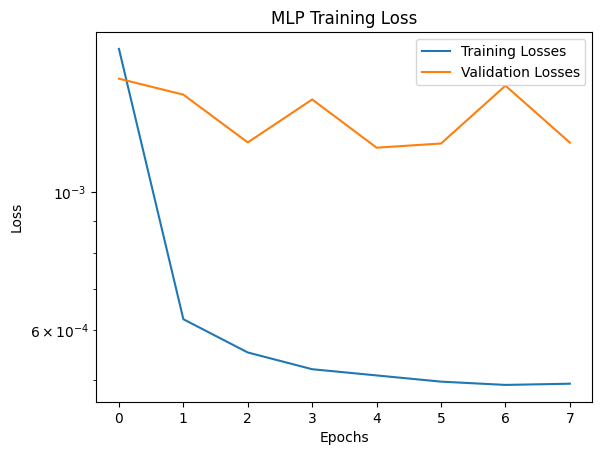

MLP R^2 = 0.6172286172744901
Validation Time = 0.7 min


In [150]:
# Simple MLP Training Parameters
batch_size = 32
epochs = 100
loss_type = "mse"
learning_rate = 0.001
weather_mlp = train_forecaster(
    length=length, 
    batch_size=batch_size, 
    epochs=epochs, 
    loss_type=loss_type, 
    Forecaster=WeatherMLP,
)
validation_forecast(weather_mlp)

In this subsection, a MLP is trained with the following properties:
1. Two deep layers, each with 100 neurons
2. A dropout layer of 20% is added after each deep layer
3. A normalization layer is added between the deep layers
4. MLP success was $R^2_{MLP,val}$ = 61.7% on validation data 

### 5.5 Training a Deep Convolutional Neural Network (CNN) Forecaster

In [151]:
class WeatherCNN(Model):
    def __init__(self, length:int, n_features:int):
        super().__init__()
        self.length = length
        self.n_features = n_features
        self.nn_type = "CNN"
        self.nn = Sequential([
            Reshape((-1 , 1, n_features)),
            Conv2D(
                filters=50, 
                kernel_size=(3 , 1), 
                strides=(1, 1), 
                padding = "valid", 
                activation="relu",
            ),
            MaxPool2D(pool_size=(2, 1)),
            Conv2D(
                filters=50, 
                kernel_size=(3 , 1), 
                strides=(1, 1), 
                padding = "valid", 
                activation="relu",
            ),
            Flatten(),
            Dense(200, activation='relu'),
            Dropout(0.2),
            Dense(200, activation='relu'),
            Dropout(0.2),
            Dense(n_features, activation='linear'),
        ])
    def call(self, x):
        forecast = self.nn(x)
        return forecast

Epoch 1/100
8492/8492 ━━━━━━━━━━━━━━━━━━━━ 31s 4ms/step - loss: 6.8916e-04 - val_loss: 0.0014
Epoch 2/100
8492/8492 ━━━━━━━━━━━━━━━━━━━━ 32s 4ms/step - loss: 5.1829e-04 - val_loss: 0.0012
Epoch 3/100
8492/8492 ━━━━━━━━━━━━━━━━━━━━ 32s 4ms/step - loss: 4.9153e-04 - val_loss: 0.0012
Epoch 4/100
8492/8492 ━━━━━━━━━━━━━━━━━━━━ 33s 4ms/step - loss: 4.7605e-04 - val_loss: 0.0012
Epoch 5/100
8492/8492 ━━━━━━━━━━━━━━━━━━━━ 33s 4ms/step - loss: 4.6046e-04 - val_loss: 0.0012
Epoch 6/100
8492/8492 ━━━━━━━━━━━━━━━━━━━━ 34s 4ms/step - loss: 4.5151e-04 - val_loss: 0.0012
Epoch 7/100
8492/8492 ━━━━━━━━━━━━━━━━━━━━ 33s 4ms/step - loss: 4.4314e-04 - val_loss: 0.0012
Training Time = 3.8062849402427674 min


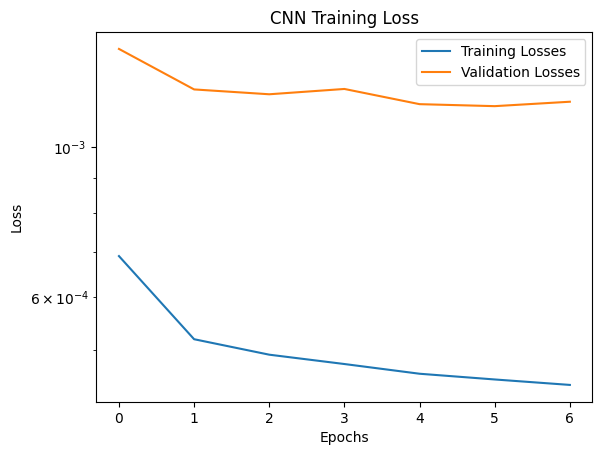

CNN R^2 = 0.6133914544248733
Validation Time = 1.3 min


In [155]:
# Simple CNN Training Parameters
batch_size = 32
epochs = 100
loss_type = "mse"
learning_rate = 0.0001
weather_cnn = train_forecaster(
    length=length, 
    batch_size=batch_size, 
    epochs=epochs, 
    loss_type=loss_type, 
    Forecaster=WeatherCNN,
)
validation_forecast(weather_cnn)

In this subsection, a CNN is trained with the following properties:
1. Two convolutional layers each with 50 filters and a kernel of 3 x 1. The width of kernel is set to one so only sequences of the same feature are examined.
2. A max pooling leyr between the two convolutional layers
3. Two deep layers each with 100 neutons are added after CNN layers.
4. A dropout layer of 20% is added after each deep layer
6. MLP success was $R^2_{CNN,val}$ = 61.3% on validation data 

### 5.6 Training a Simple but Deep Recurrent Neural Network (RNN) Forecaster

In [156]:
class WeatherSimpleRNN (Model):
    def __init__(self, length:int, n_features:int):
        super().__init__()
        self.length = length
        self.n_features = n_features
        self.nn_type = "simple_RNN"
        self.nn = Sequential([
            SimpleRNN(units=50, input_shape=(length, n_features)),
            Dense(200, activation='relu'),
            Dropout(0.2),
            Dense(200, activation='relu'),
            Dropout(0.2),
            Dense(n_features, activation='linear'),
        ])
    def call(self, x):
        forecast = self.nn(x)
        return forecast

Epoch 1/100


C:\Users\basha\AppData\Local\Programs\Python\Python311\Lib\site-packages\keras\src\layers\rnn\rnn.py:199: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
C:\Users\basha\AppData\Local\Programs\Python\Python311\Lib\site-packages\keras\src\trainers\data_adapters\py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


8492/8492 ━━━━━━━━━━━━━━━━━━━━ 28s 3ms/step - loss: 5.5727e-04 - val_loss: 0.0013
Epoch 2/100
8492/8492 ━━━━━━━━━━━━━━━━━━━━ 26s 3ms/step - loss: 4.8286e-04 - val_loss: 0.0012
Epoch 3/100
8492/8492 ━━━━━━━━━━━━━━━━━━━━ 27s 3ms/step - loss: 4.6892e-04 - val_loss: 0.0012
Epoch 4/100
8492/8492 ━━━━━━━━━━━━━━━━━━━━ 28s 3ms/step - loss: 4.5735e-04 - val_loss: 0.0012
Epoch 5/100
8492/8492 ━━━━━━━━━━━━━━━━━━━━ 28s 3ms/step - loss: 4.4951e-04 - val_loss: 0.0012
Epoch 6/100
8492/8492 ━━━━━━━━━━━━━━━━━━━━ 28s 3ms/step - loss: 4.4353e-04 - val_loss: 0.0013
Epoch 7/100
8492/8492 ━━━━━━━━━━━━━━━━━━━━ 28s 3ms/step - loss: 4.4033e-04 - val_loss: 0.0011
Training Time = 3.2352696299552917 min


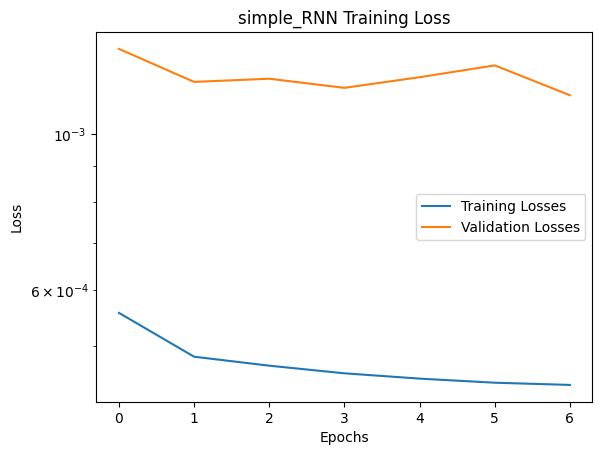

simple_RNN R^2 = 0.6218024515980307
Validation Time = 5.1 min


In [157]:
# Simple RNN Training Parameters
batch_size = 32
epochs = 100
loss_type = "mse"
learning_rate = 0.001
weather_simple_rnn = train_forecaster(
    length=length, 
    batch_size=batch_size, 
    epochs=epochs, 
    loss_type=loss_type, 
    Forecaster=WeatherSimpleRNN,
)
validation_forecast(weather_simple_rnn)

In this subsection, a Tensorflow simple RNN is trained with the following properties:
1. One simple RNN layer with 50 units
2. Two deep layers each with 100 neutons are added after CNN layers.
4. A dropout layer of 20% is added after each deep layer
6. MLP success was $R^2_{RNN,val}$ = 62.2% on validation data 

### 5.7 Training a Deep Long Short-Term Memomry (LSTM) Forecaster

Next in the list of RNN models is the Long-Short-Term-Memory model. This is a more more sophisticated than simple RNN, so let's see by using the same network and just by replacing SimpleRNN with LSTM we can achieve lower error on validation: 

In [158]:
class WeatherLSTM (Model):
    def __init__(self, length:int, n_features:int):
        super().__init__()
        self.length = length
        self.n_features = n_features
        self.nn_type = "LSTM"
        self.nn = Sequential([
            LSTM(units=50, input_shape=(length, n_features)),
            Dense(200, activation='relu'),
            Dropout(0.2),
            Dense(200, activation='relu'),
            Dropout(0.2),
            Dense(n_features, activation='linear'),
        ])
    def call(self, x):
        forecast = self.nn(x)
        return forecast

Epoch 1/100


C:\Users\basha\AppData\Local\Programs\Python\Python311\Lib\site-packages\keras\src\layers\rnn\rnn.py:199: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
C:\Users\basha\AppData\Local\Programs\Python\Python311\Lib\site-packages\keras\src\trainers\data_adapters\py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


8492/8492 ━━━━━━━━━━━━━━━━━━━━ 54s 6ms/step - loss: 5.7612e-04 - val_loss: 0.0012
Epoch 2/100
8492/8492 ━━━━━━━━━━━━━━━━━━━━ 54s 6ms/step - loss: 4.7989e-04 - val_loss: 0.0012
Epoch 3/100
8492/8492 ━━━━━━━━━━━━━━━━━━━━ 53s 6ms/step - loss: 4.6022e-04 - val_loss: 0.0012
Epoch 4/100
8492/8492 ━━━━━━━━━━━━━━━━━━━━ 53s 6ms/step - loss: 4.4916e-04 - val_loss: 0.0011
Epoch 5/100
8492/8492 ━━━━━━━━━━━━━━━━━━━━ 53s 6ms/step - loss: 4.4299e-04 - val_loss: 0.0012
Epoch 6/100
8492/8492 ━━━━━━━━━━━━━━━━━━━━ 54s 6ms/step - loss: 4.3742e-04 - val_loss: 0.0012
Training Time = 5.350990887482961 min


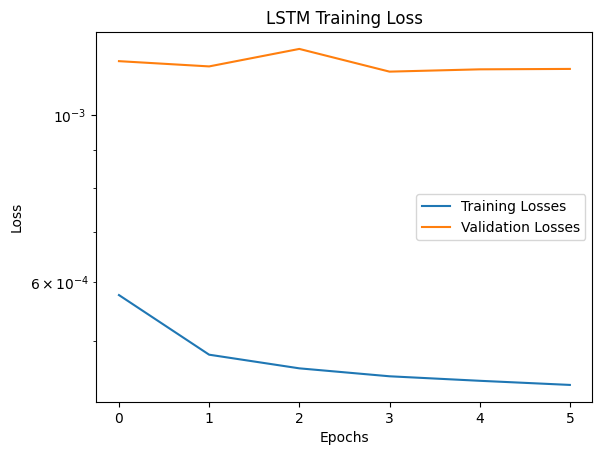

LSTM R^2 = 0.6256342160733717
Validation Time = 7.4 min


In [159]:
# LSTM Training Parameters
batch_size = 32
epochs = 100
loss_type = "mse"
learning_rate = 0.001
weather_lstm = train_forecaster(
    length=length, 
    batch_size=batch_size, 
    epochs=epochs, 
    loss_type=loss_type, 
    Forecaster=WeatherLSTM,
)
validation_forecast(weather_lstm)

In this subsection, a Tensorflow LSTM is trained with the following properties:
1. One LSTM layer with 50 units
2. Two deep layers each with 100 neutons are added after CNN layers.
4. A dropout layer of 20% is added after each deep layer
6. MLP success was $R^2_{LSTM,val}$ = 62.6% on validation data 

### 5.8 Training a Deep Gated Recurrent Units (GRU) Forecaster

The last type of RNN network to try is Gated-Recurrent-Units (GRU). GRU is also more sophisticated than simpleRNN but simpler than quicker to train and run compared to LSTM.

In [160]:
class WeatherGRU (Model):
    def __init__(self, length:int, n_features:int):
        super().__init__()
        self.length = length
        self.n_features = n_features
        self.nn_type = "GRU"
        self.nn = Sequential([
            GRU(units=50, input_shape=(length, n_features)),
            Dense(200, activation='relu'),
            Dropout(0.2),
            Dense(200, activation='relu'),
            Dropout(0.2),
            Dense(n_features, activation='linear'),
        ])
    def call(self, x):
        forecast = self.nn(x)
        return forecast

Epoch 1/100


C:\Users\basha\AppData\Local\Programs\Python\Python311\Lib\site-packages\keras\src\layers\rnn\rnn.py:199: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
C:\Users\basha\AppData\Local\Programs\Python\Python311\Lib\site-packages\keras\src\trainers\data_adapters\py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


8492/8492 ━━━━━━━━━━━━━━━━━━━━ 56s 6ms/step - loss: 5.5433e-04 - val_loss: 0.0012
Epoch 2/100
8492/8492 ━━━━━━━━━━━━━━━━━━━━ 57s 7ms/step - loss: 4.7989e-04 - val_loss: 0.0013
Epoch 3/100
8492/8492 ━━━━━━━━━━━━━━━━━━━━ 58s 7ms/step - loss: 4.6062e-04 - val_loss: 0.0012
Epoch 4/100
8492/8492 ━━━━━━━━━━━━━━━━━━━━ 58s 7ms/step - loss: 4.4970e-04 - val_loss: 0.0011
Epoch 5/100
8492/8492 ━━━━━━━━━━━━━━━━━━━━ 58s 7ms/step - loss: 4.4274e-04 - val_loss: 0.0012
Epoch 6/100
8492/8492 ━━━━━━━━━━━━━━━━━━━━ 58s 7ms/step - loss: 4.3663e-04 - val_loss: 0.0011
Training Time = 5.75158562262853 min


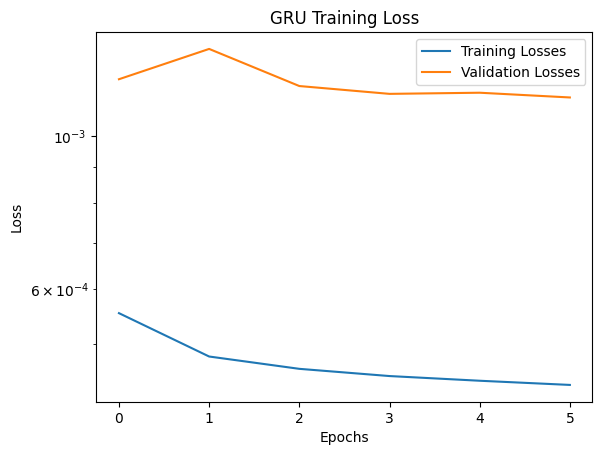

GRU R^2 = 0.6168038016193244
Validation Time = 11.6 min


In [161]:
# GRU Training Parameters
batch_size = 32
epochs = 100
loss_type = "mse"
learning_rate = 0.001
weather_gru = train_forecaster(
    length=length, 
    batch_size=batch_size, 
    epochs=epochs, 
    loss_type=loss_type, 
    Forecaster=WeatherGRU,
)
validation_forecast(weather_gru)

In this subsection, a Tensorflow GRU is trained with the following properties:
1. One GRU layer with 50 units
2. Two deep layers each with 100 neutons are added after CNN layers.
4. A dropout layer of 20% is added after each deep layer
6. MLP success was $R^2_{GRU,val}$ = 61.7% on validation data 

### 5.9 Testing the best selected forecaster on the test data (2024 weather data)

Among the five network trained, LSTM has a slightly better performance than the other models and so is selected to try test data on it.

Here we start with the original test data which is the weather data from Jan 1st 2024 to Dec 31st 2024, and apply the following process to them:
1. Cutting out 2024 data from X as the test data
2. Applying the pre-encoding standard scaler
3. Encode
4. Apply the pre-rnn min-max scaling, called here "rescaling"
5. get forecasts from the selected RNN model
6. Apply inverse of pre-rnn min-max scaling (de-rescaling)
7. Decode
8. de-scale (inverse of standard scaler)
9. Compare the result at this point with the original X_test

#### ⚠️ Data Snooping ⚠️
The splitting method for test data in autoencoder training and RNN models training are different: For autoencoder training the data is shuffled and then 10% is set aside for testing whereas for RNN forecasting the last 8760 rows in the timeseriers (2024 year data) are reserved for testing. So some test data here might have been part of training or validation data for autoendcoder training. But we ignore this issue as the test data for autoencoder training was already applied and here we are only aiming for testing the trained RNN model.  

In [163]:
weather_forecaster = weather_lstm

X_test = X[val_end - length:,:]
X_scaled_test = ss.transform(X_test)
X_encoded_test = best_autoencoder.encoder(X_scaled_test)
X_encoded_rescaled_test = mms.transform(X_encoded_test)
update_sequence_with_forcast = False
forecasts = []
forecast_error_percents = []
model_input = X_encoded_rescaled_test.copy()
for i in range(model_input.shape[0] - length):
    sequence = model_input[i:i+length,:].reshape(1 , length, -1)
    forecast_rescaled = weather_forecaster.call(sequence).numpy()
    forecast_encoded = mms.inverse_transform(forecast_rescaled)
    forecast_scaled = best_autoencoder.decoder(forecast_encoded)
    forecast = ss.inverse_transform(forecast_scaled)
    forecasts.append(forecast)
    forecast_error = forecast - X_test[i+length, :]
    forecast_error_percent = (
        np.linalg.norm(forecast_error) / np.linalg.norm(X_test[i+length]) * 100.0
    )
    forecast_error_percents.append(forecast_error_percent)
    if update_sequence_with_forcast:
        model_input[i+length, 0:n_features] = forecast_rescaled
    if(i + 1) % 1000 == 0:
        print(f"Forecast # {i + 1}, error = {forecast_error_percent} %")
print(" ----- DONE ------------- ")

Forecast # 1000, error = 4.717776585753697 %
Forecast # 2000, error = 8.334336541835135 %
Forecast # 3000, error = 4.759634549966927 %
Forecast # 4000, error = 8.632302227010578 %
Forecast # 5000, error = 13.599703301797575 %
Forecast # 6000, error = 18.781470451626383 %
Forecast # 7000, error = 2.859158106297365 %
Forecast # 8000, error = 5.5613375111668635 %
 ----- DONE ------------- 


LSTM R^2 = 0.6066408683833018


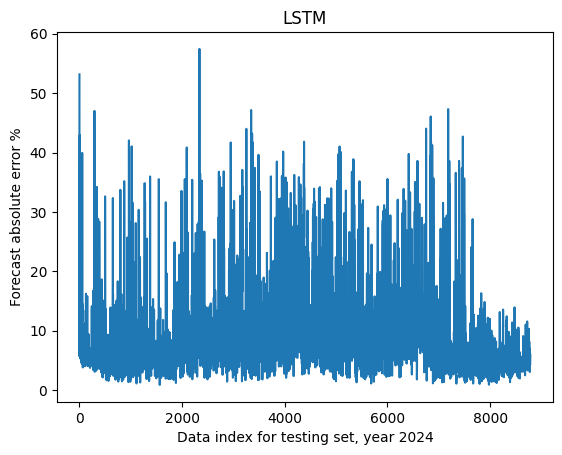

In [164]:
forecasts_test = np.array(forecasts).reshape(-1 , X_test.shape[1])
r2_test = r2_score(y_true=X_test[length:,:], y_pred=forecasts_test)
print(f"{weather_forecaster.nn_type} R^2 = {r2_test}")
plt.plot(forecast_error_percents)
plt.xlabel("Data index for testing set, year 2024")
plt.ylabel("Forecast absolute error %")
plt.title(f"{weather_forecaster.nn_type}")
plt.show()

Thus the trained deep LSTM models has a coefficent of determination of $R^2_{LSTM,test}$ = 60.7% which is consistent with the coefficient found for validation data. We also see that the LSTM model occasionally has an relative error of 55% on test data but most of the data the error is below 40%.

## 6. Conclusions

In this notebook we used weather data for Austin TX from 1992 to 2024 and tried to train autoencoders to compress the weather data and next to train forecasters using recurrent neural networks. 

### Key Findings
1. Starting from a weather data containing 14 features, various autoencoders with different latent features were trained. Using the $R^2$ on compating the validation data and its recovered form from encoder-decoder network, the latent feature of five deemed acceptable because $R^2_{val} > 0.95$. Trying to also apply the best autoencoder on test data it was observed that $R^2_{test} ~= 0.95$ for comparing the original and recovered test data.
2. Next we have tried to forcast the next hour compressed weather data using the past 3 days compressed weather data. We have used three recurrent neural network models discussed in three next points.
3. Weather forecast using 2-layer MLP: $R_{MLP,val}^2$ = 61.7%
4. Weather forecast using deep CNN: $R_{CNN,val}^2$ = 61.3%
5. Weather forecast using simple but deep RNN: $R_{RNN,val}^2$ = 62.2%
6. Weather forecast using deep LSTM:  $R_{LSTM,val}^2$  = 62.6%
7. Weather forecast using deep GRU:  $R_{GRU,val}^2$ = 62.6%
8. Selecting LSTM, on test data: $R^2_{LSTM,test}$ = 0.65

### Possible Issues
1. As explained in subsection 5.9 There might be some data snooping between validation and test data sets for training autoencoder into training the weather forecaster.
2. The training loss plots in section 5 are stopped very early showing that it's possible the models do not have enough training features to predict weather
3. The ideal method would have been to use forecasted values to further forecast next time data; however, the practice here was restricted to using provided data (and not forecasted ones) to predict the next hour weather and then it is assumed that the forecast will be replaced with actual data from sensors.

### Next Steps
1. Since have used autoendcoders it will be interesting to expand the original set of weather features beyond the 14 ones that are considered here. We have also did not look into possible high correlations among the original features and whether the resulting compressed features are just some features removed or they truely represent combined features.
2. One can also try to compare autoendcoders trained here with the results from principal component analysis (PCA). If the outcomes are not the same that means there were significant nonlinear interplays between the features.
3. In this problem, Simple RNN, LSTM and GRU could be augmented wuth Dense layers to imporve performance
4. CNN 2D could also be examined instead of RNNs.  